In [1]:
# log:
# 16.04: created file
# 22.04: just to comment wtf this file is -> it was used to develod the main code, so just to test functions and see if everything was working as it should etc

# acronyms:
# ts              transect

In [2]:
from helper import *

In [3]:
# Load everything
dataset = UHIDataSet(r"E:\mjosa\29\uhi_rad\active_subset")
dataset.describe_all()


📂 Total files loaded: 2

=== rad_uhi_20241029_115057_5 ===
Shape: (2478, 968, 210)
 - Tracks (time steps):     2478
 - Actual track indices:    0 to 2477
 - Slit pixels:             968
 - Wavelengths (bands):     210
 - Intensity range:         0.000 to 0.884

=== rad_uhi_20241029_115057_2 ===
Shape: (1844, 968, 210)
 - Tracks (time steps):     1844
 - Actual track indices:    0 to 1843
 - Slit pixels:             968
 - Wavelengths (bands):     210
 - Intensity range:         0.000 to 1.284



=== rad_uhi_20241029_115057_5 ===
Shape: (2478, 968, 210)
 - Tracks (time steps):     2478
 - Actual track indices:    0 to 2477
 - Slit pixels:             968
 - Wavelengths (bands):     210
 - Intensity range:         0.000 to 0.884


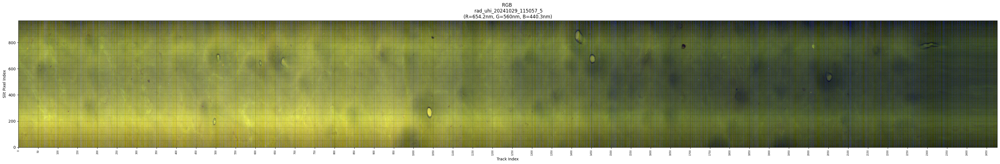

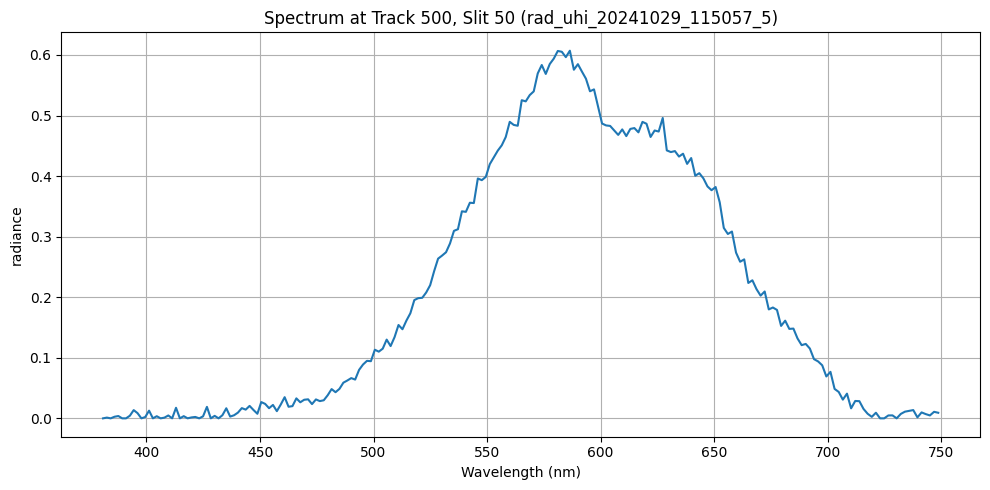

In [4]:
# Access one file
cube = dataset.files["rad_uhi_20241029_115057_5"]
cube.describe()
cube.plot_rgb(spacing=3)

# check if spectrum looks ok
cube.plot_spectrum(track_index=500, slit_index=50, ylabel="radiance")

small code to try to correct for dark shit but didnt work so just commented it out

In [5]:
# with h5py.File(cube.filepath, "r") as f:
#     data = cube.data
#     dark = f["processed/radiance/calibration/radiometric/darkFrame"][()]
#     flat = f["processed/radiance/calibration/radiometric/radiometricFrame"][()]

# print("data shape: ", data.shape)
# print("dark shape: ", dark.shape)
# print("flat shape: ", flat.shape)

In [6]:
# tried to correct for the dark current but wen to shit

# cube = dataset.files["rad_uhi_20241029_115057_5"]  # or whichever name matches
# # corrected_cube = cube.apply_flat_field_correction()
# corrected_cube.plot_mean_spectrum()

end of dark shit

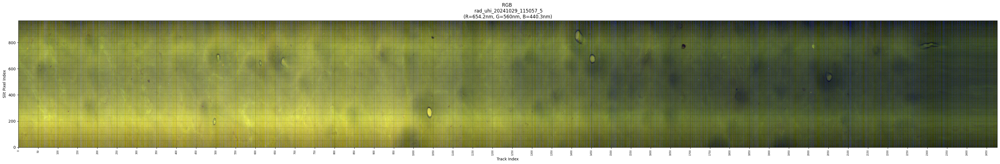

In [7]:
cube.plot_rgb(spacing=3)


=== rad_uhi_20241029_115057_5 ===
Shape: (500, 968, 210)
 - Tracks (time steps):     500
 - Actual track indices:    1000 to 1499
 - Slit pixels:             968
 - Wavelengths (bands):     210
 - Intensity range:         0.000 to 0.839


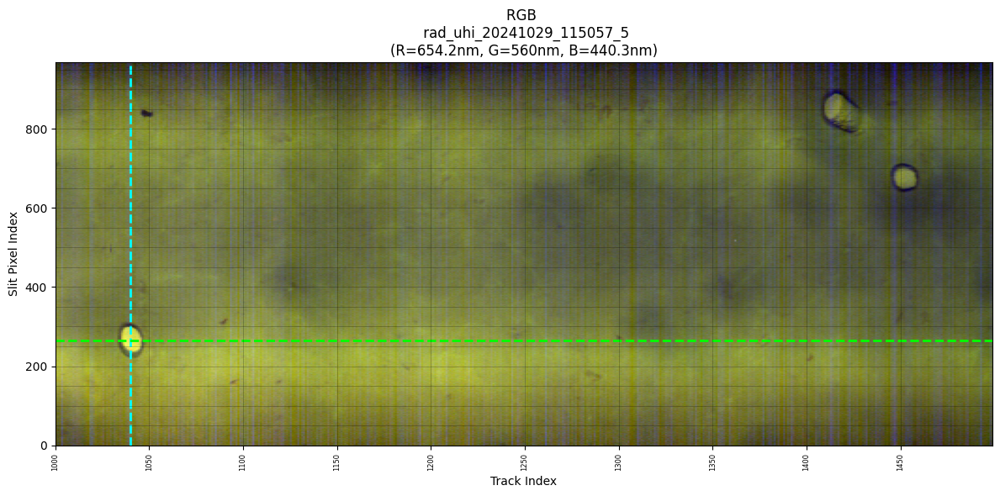

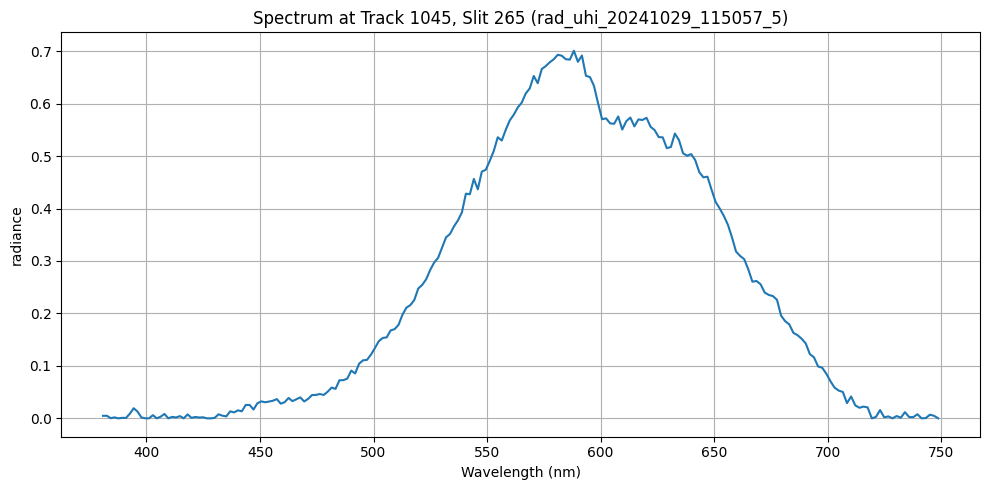

In [8]:
# load shorter cube instead of the whole cube, useful for testing
short_cube = cube.slice_tracks(1000, 1500)
short_cube.describe()


short_cube.plot_rgb(track_index=1040, slit_index=265)


short_cube.plot_spectrum(track_index=1045, slit_index=265, ylabel="radiance")


=== rad_uhi_20241029_115057_5 ===
Shape: (500, 968, 210)
 - Tracks (time steps):     500
 - Actual track indices:    1000 to 1499
 - Slit pixels:             968
 - Wavelengths (bands):     210
 - Intensity range:         0.000 to 44.453


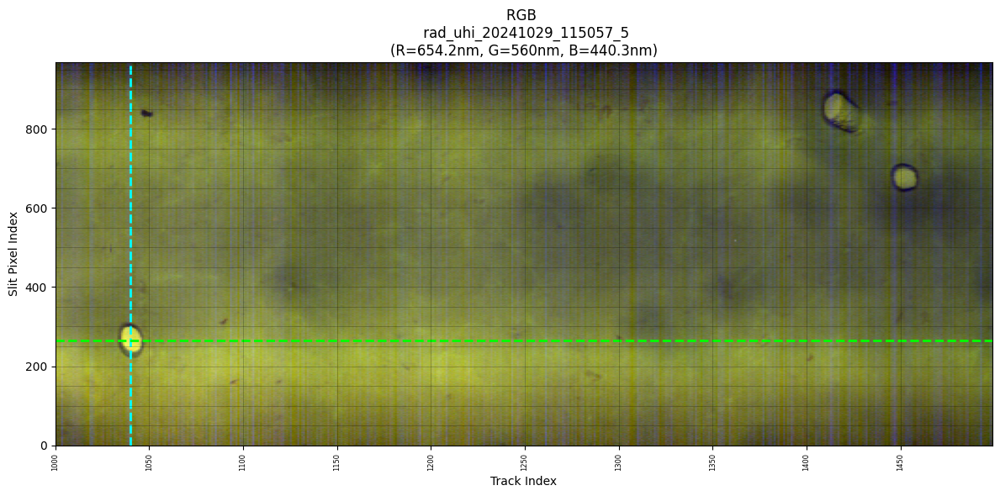

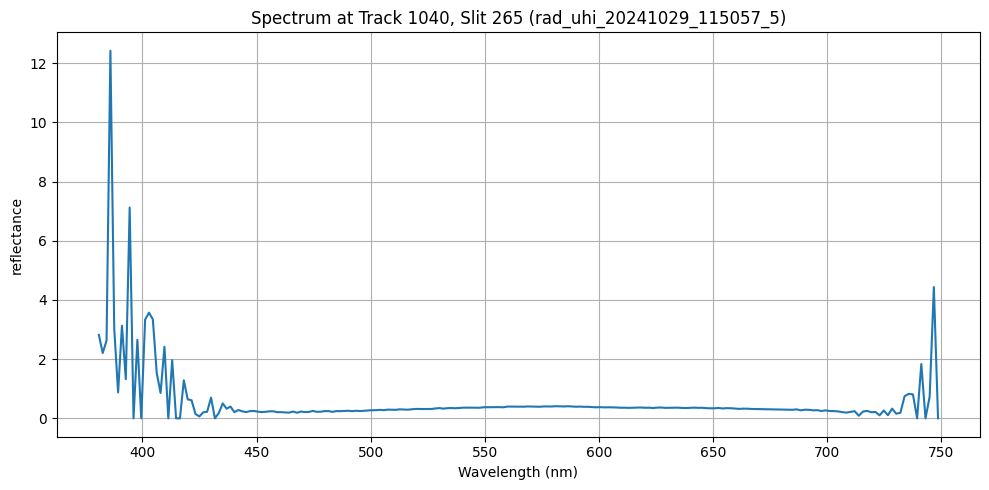

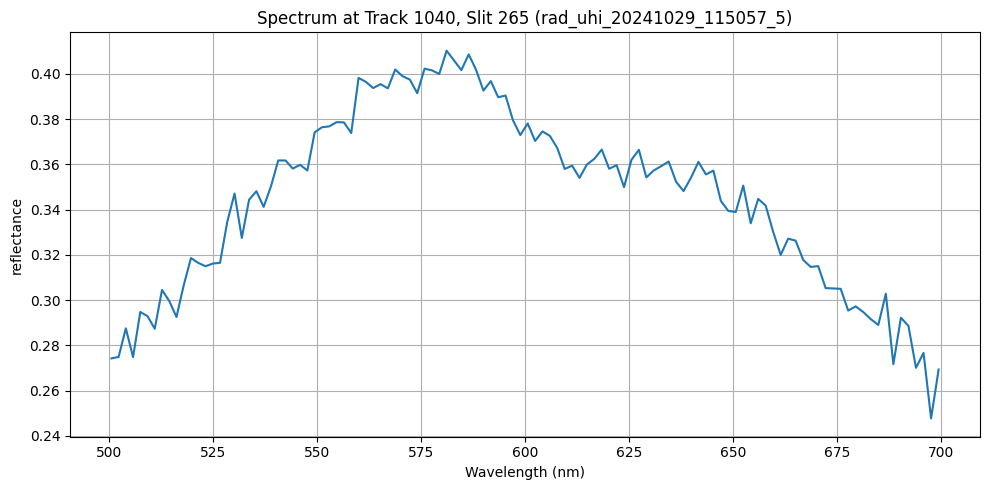

In [9]:
# test reflectance convertion
reflectance_data = short_cube.get_reflectance(
    r"E:\mjosa\29\ROIs\statistics_rad\reflectance_plate.txt"
)


reflectance_data.describe()


reflectance_data.plot_rgb(track_index=1040, slit_index=265)


reflectance_data.plot_spectrum(track_index=1040, slit_index=265, ylabel="reflectance")

reflectance_data_cut = reflectance_data.change_wavelength_interval(500, 700)
reflectance_data_cut.plot_spectrum(
    track_index=1040, slit_index=265, ylabel="reflectance"
)


=== rad_uhi_20241029_115057_5 ===
Shape: (500, 968, 210)
 - Tracks (time steps):     500
 - Actual track indices:    1000 to 1499
 - Slit pixels:             968
 - Wavelengths (bands):     210
 - Intensity range:         nan to nan


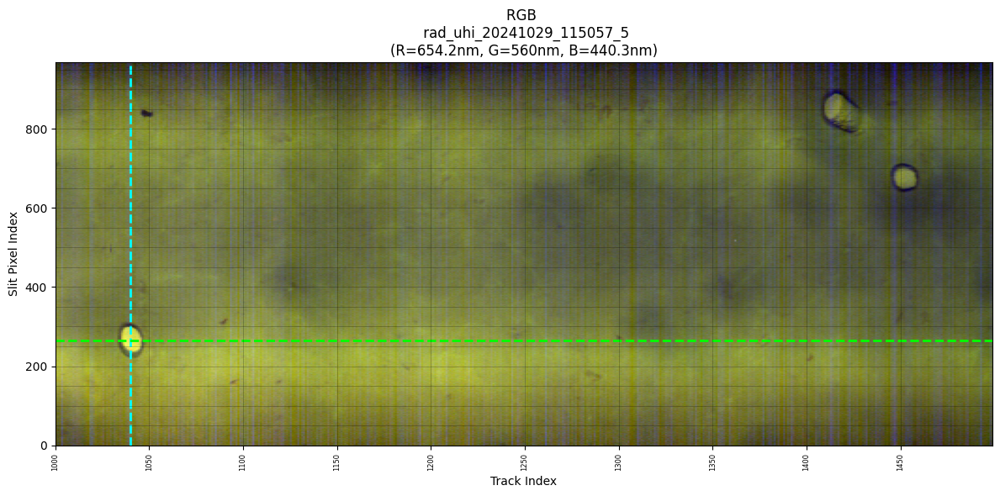

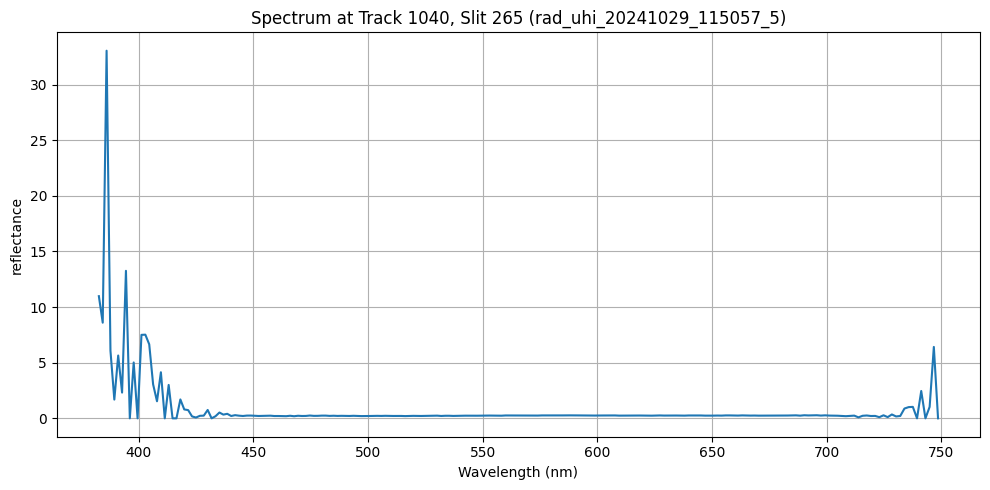

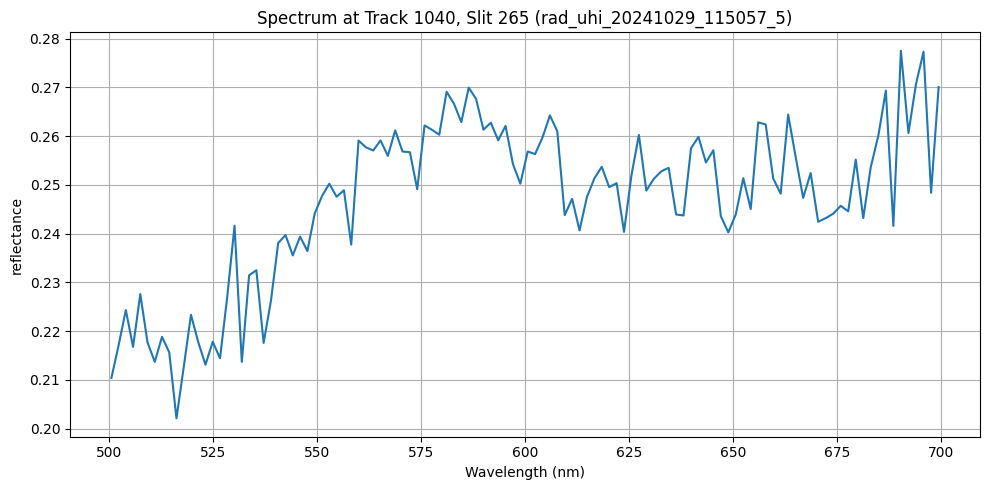

In [10]:
# again, test reflectance, but use the other reflectance calculation function
reflectance_data_new = short_cube.get_reflectance_normalize(
    r"E:\mjosa\29\ROIs\statistics_rad\reflectance_plate.txt"
)
reflectance_data_new.describe()
reflectance_data_new.plot_rgb(track_index=1040, slit_index=265)

reflectance_data_new.plot_spectrum(
    track_index=1040, slit_index=265, ylabel="reflectance"
)

reflectance_data_cut = reflectance_data_new.change_wavelength_interval(500, 700)
reflectance_data_cut.plot_spectrum(
    track_index=1040, slit_index=265, ylabel="reflectance"
)

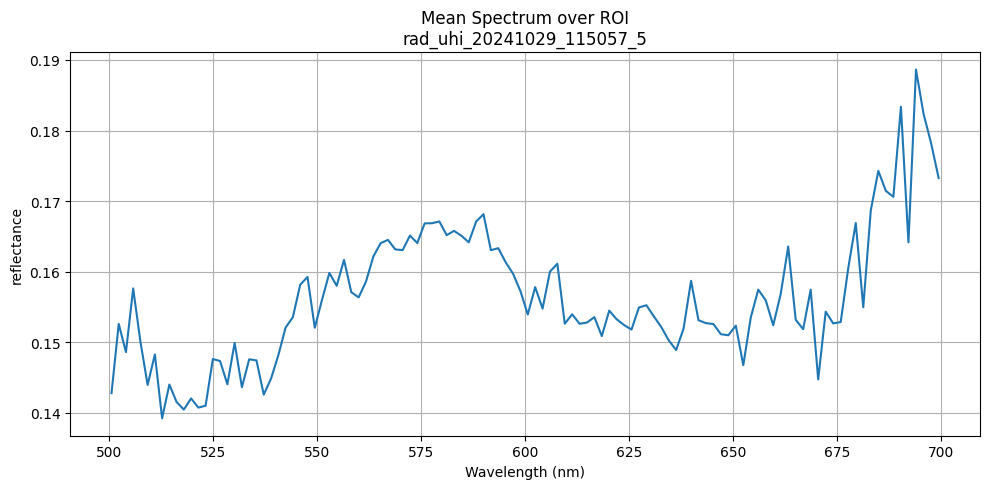

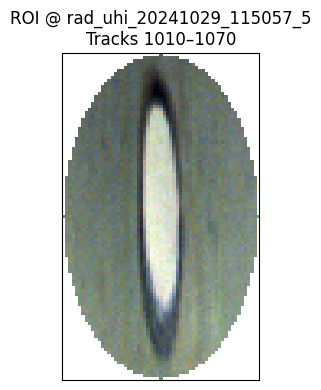

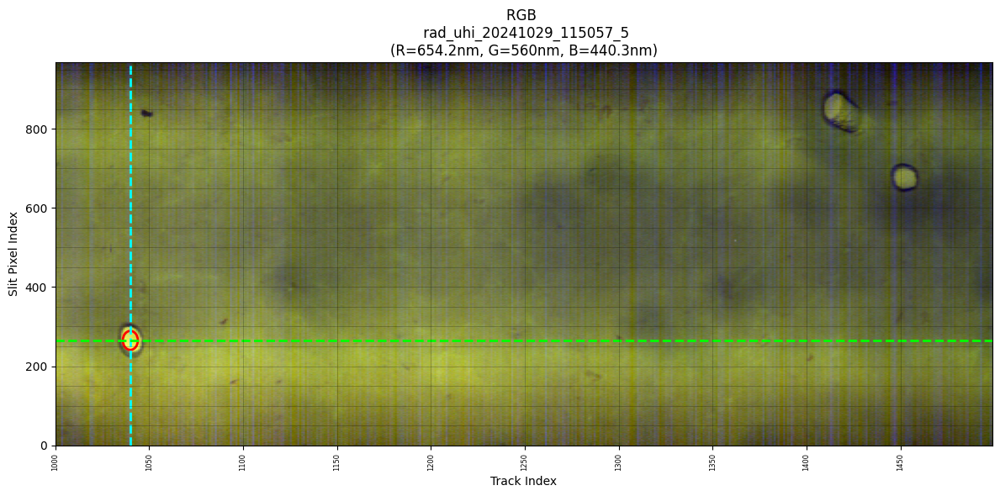

In [11]:
ROI_ellipse = reflectance_data_new.get_ROI_ellipse(
    1040, 265, radius_track=30, radius_slit=50, elliptical=True
).change_wavelength_interval(500, 700)


ROI_ellipse.plot_mean_spectrum(ylabel="reflectance")
ROI_ellipse.plot_roi_rgb()

reflectance_data_new.plot_rgb(
    track_index=1040, slit_index=265, roi_radii=(4, 24), roi_edgecolor="red"
)

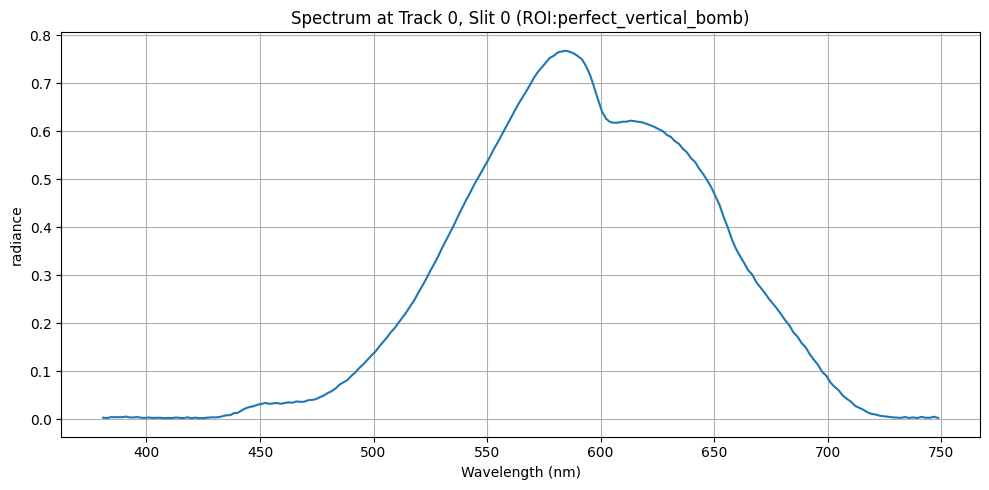

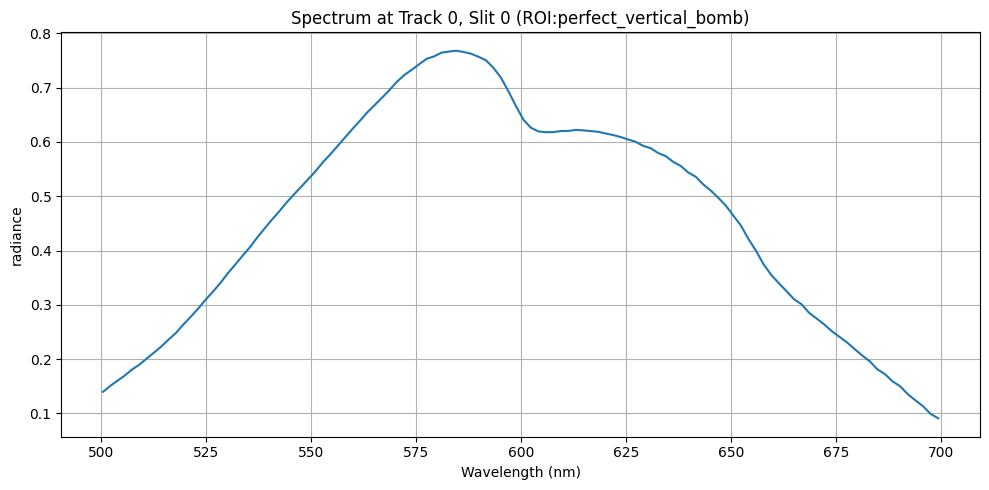

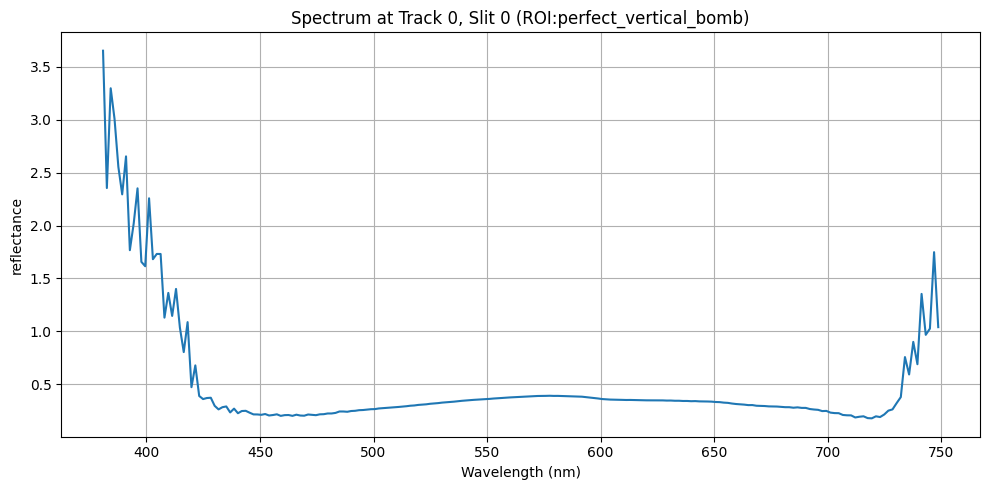

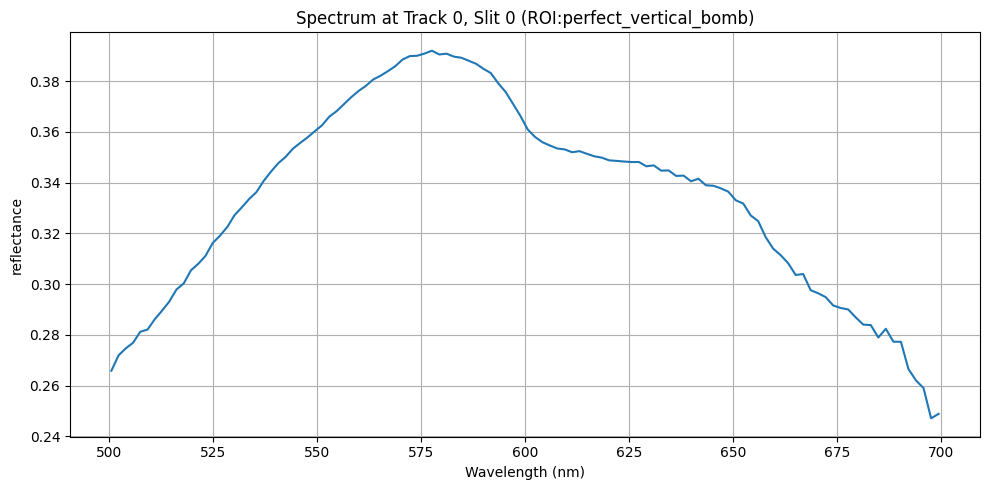

In [12]:
# try to check the ROIs and their values, but sees like its more shit

roi_cube = load_roi_as_cube(
    r"E:\mjosa\29\ROIs\statistics_rad\perfect_vertical_bomb.txt"
)

roi_cube.plot_spectrum(track_index=0, slit_index=0, ylabel="radiance")
roi_cube.change_wavelength_interval(500, 700).plot_spectrum(
    track_index=0, slit_index=0, ylabel="radiance"
)
relf_roi_cube = roi_cube.get_reflectance(
    r"E:\mjosa\29\ROIs\statistics_rad\reflectance_plate.txt"
)
relf_roi_cube.plot_spectrum(track_index=0, slit_index=0, ylabel="reflectance")

relf_roi_cube.change_wavelength_interval(500, 700).plot_spectrum(
    track_index=0, slit_index=0, ylabel="reflectance"
)

x_values = [540.6, 560, 579, 602.4, 629, 672]
y_values = [0.3467987804878049, 0.3759036144578313, 0.3917525773195876, 0.3525714285714286, 0.3471654003506721, 0.293854748603352]


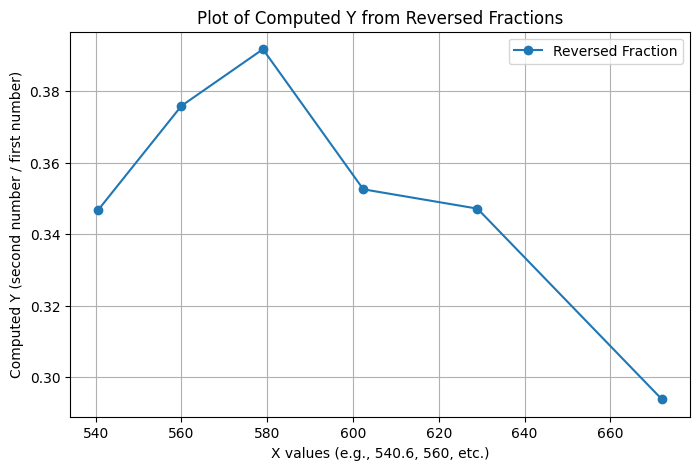

In [13]:
# didnt understand diference, so took few points and tested to see if reflecrtance was same
import matplotlib.pyplot as plt

# Data provided
x_values = [540.6, 560, 579, 602.4, 629, 672]

# Compute y-values by taking the second number divided by the first number in each fraction.
# Data interpreted as (first number, second number / first number of fraction):
fractions = [
    (1.312, 0.455),
    (1.660, 0.624),
    (1.940, 0.76),
    (1.750, 0.617),  # Interpreting '0617' as 0.617
    (1.711, 0.594),
    (0.895, 0.263),
]

# Reverse the fraction: y = second number / first number in fraction
y_values = [second / first for first, second in fractions]

# Print computed y_values for verification:
print("x_values =", x_values)
print("y_values =", y_values)

# Create the plot
plt.figure(figsize=(8, 5))
plt.plot(x_values, y_values, marker="o", linestyle="-", label="Reversed Fraction")
plt.xlabel("X values (e.g., 540.6, 560, etc.)")
plt.ylabel("Computed Y (second number / first number)")
plt.title("Plot of Computed Y from Reversed Fractions")
plt.legend()
plt.grid(True)
plt.show()

In [14]:
# Will now try to create training data


=== rad_uhi_20241029_115057_5 ===
Shape: (200, 968, 210)
 - Tracks (time steps):     200
 - Actual track indices:    1000 to 1199
 - Slit pixels:             968
 - Wavelengths (bands):     210
 - Intensity range:         0.000 to 0.839


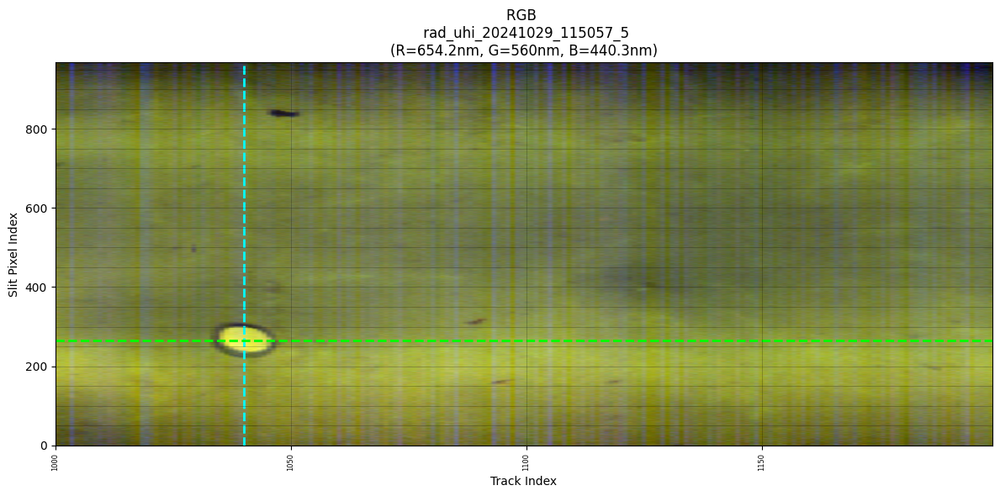

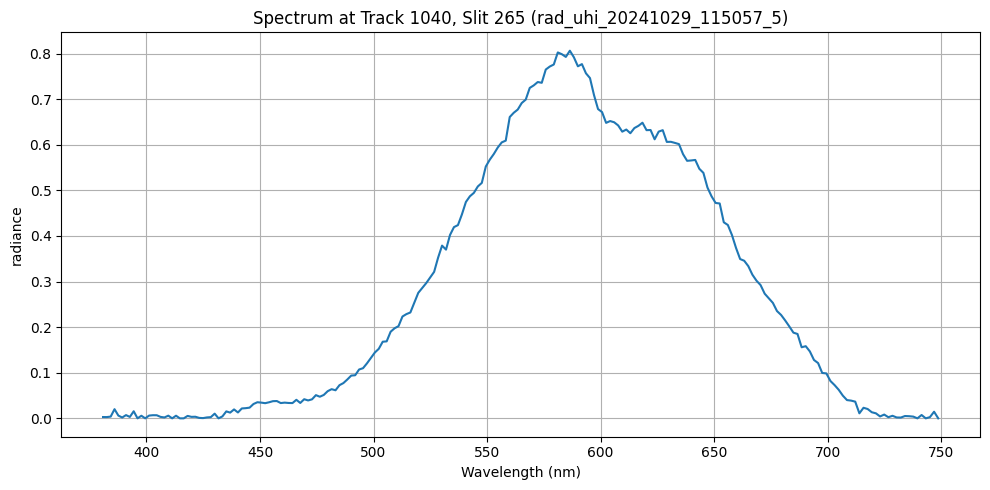

In [15]:
super_short_cube = cube.slice_tracks(1000, 1200)
super_short_cube.describe()
super_short_cube.plot_rgb(track_index=1040, slit_index=265)
super_short_cube.plot_spectrum(track_index=1040, slit_index=265, ylabel="radiance")

need to verify the labeling

In [16]:
plot_segments_random(folder=r"E:\mjosa\29\training_data", num_samples=5)

No .npz files found in folder.


In [17]:
# # Plot **all** segments in radiance:
# plot_labeled_segments(r"E:\mjosa\29\training_data\radiance")

# # Plot **only** the 'dark' segments across all transects:
# plot_labeled_segments(r"E:\mjosa\29\training_data\radiance", label="dark")

# # Plot **all** segments for a single transect:
# plot_labeled_segments(
#     r"E:\mjosa\29\training_data\radiance", transect="rad_uhi_20241029_115057_5"
# )

# # Plot **only** 'bomb' segments of that transect:
# plot_labeled_segments(
#     r"E:\mjosa\29\training_data\radiance",
#     transect="rad_uhi_20241029_115057_5",
#     label="bomb",
# )

In [18]:
plot_labeled_segments(
    r"E:\mjosa\29\training_data_new\fundation\only_1_segment\augmented"
)


▶️ Plotting segments from: 'E:\\mjosa\\29\\training_data_new\\fundation\\only_1_segment\\augmented'

